In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import warnings
warnings.filterwarnings('ignore')  # "error", "ignore", "always", "default", "module" or "once"


In [4]:
import pandas as pd
import sklearn as sk
import numpy as np
from pandas import DataFrame
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.feature_selection import SelectKBest, chi2, mutual_info_classif, f_classif
import matplotlib.pyplot as plt
import seaborn as sns
from statistics import mean
from matplotlib.pyplot import figure
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import confusion_matrix, classification_report, ConfusionMatrixDisplay, roc_curve, auc
from sklearn.model_selection import StratifiedKFold, train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.multiclass import OneVsRestClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.neural_network import MLPClassifier
from sklearn.preprocessing import LabelEncoder, OrdinalEncoder
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn import metrics
from yellowbrick.classifier.rocauc import roc_auc


In [6]:
df = pd.read_excel("./drive/MyDrive/DATASCIENCEDELIVERY2/IssueTickets.xlsx")

In [49]:
X_df = df.drop("WORKER", axis=1)
# X_df = pd.get_dummies(df.drop("WORKER", axis = 1))
values = [
          [0,3,4,8,9],
          [3,4,5,7,8],
          [0,4,6,8,9],
          [0,3,4],
          [3,4,5],
          [0,4,6]
]
X_df = X_df.iloc[:, [0,3,4]]
ord_encoder = OrdinalEncoder()
y_le = LabelEncoder()


In [44]:
def get_X_y():
    print(f"X_df columns are {X_df.columns}")

    X = []
    y = y_le.fit_transform(df["WORKER"])
    X = ord_encoder.fit_transform(X_df)
    return X, y


def classify(X, y, classifier, classifier_name):
    cv = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)
    workers = np.unique(df["WORKER"].to_numpy())
    
    for i, (train, test) in enumerate(cv.split(X, y)):
        print(f"\n{i+1}th run of {type(classifier)}")
        classifier.fit(X[train], y[train])
        predicted = classifier.predict(X[test])

        # confusion matrix
        sns.set(rc = {'figure.figsize':(40,20)})
        a = sns.heatmap(confusion_matrix(y[test],predicted), cmap="YlGnBu", fmt="d", linewidths=.1, annot=True)
        # classification report
        cr = classification_report(y[test], predicted, zero_division=False)
        print(cr)
        plt.show()
        #ROC CURVE
        y_scores = classifier.predict_proba(X[test])
        le = LabelEncoder()
        y_test_fold = le.fit_transform(y[test])


        #print(y_test_fold)
        fpr_list = []
        tpr_list = []
        auc_list = []
        roc_auc_list = []
        print(y_scores.shape[1])
        for i in range(y_scores.shape[1]):
            fpr, tpr, thresholds = roc_curve(y_test_fold, y_scores[:, i], pos_label=i)
            #print(fpr, tpr)
            fpr_list.append(fpr)
            tpr_list.append(tpr)
            auc_score = auc(fpr, tpr)
            auc_list.append(auc_score)
            roc_auc_list.append(auc_score)
        i = 0
        for fpr, tpr in zip(fpr_list, tpr_list):
            plt.plot(fpr, tpr, label=f'Class {i}')
            i+=1
            
        plt.legend(loc='lower right', ncol=2)
        plt.plot([0, 1], [0, 1], 'r--')
        plt.xlim([0, 1])
        plt.ylim([0, 1])
        plt.ylabel('TPR')
        plt.xlabel('FPR')
        plt.show()

        print("\n" * 3)
        
        
def make_feature_selection(X, y, feature_names):
    features = {"x0": ("REPORTER", []), "x1": ("ISSUE_TYPE", []), "x2": ("PRIORITY", []), "x3": ("COMPNAME", []), "x4": ("JIRANAME", []), "x5": ("WORKER", []), "x6": ("EMPLOYEE_TYPE", []), "x7": ("WORK_LOG", []), "x8": ("CREATION_DATE", []), "x9": ("RESOLUTION_DATE", [])}
    selectors = []
    sel_mi = SelectKBest(mutual_info_classif, k='all')
    arr_mi = sel_mi.fit_transform(X, y)
    selectors.append(sel_mi)

    sel_f = SelectKBest(f_classif, k='all')
    arr_f = sel_f.fit_transform(X, y)
    selectors.append(sel_f)

    sel_chi = SelectKBest(chi2, k='all')
    arr_chi = sel_chi.fit_transform(X, y)
    selectors.append(sel_chi)
    
    print(sel_mi.scores_, sel_f.scores_, sel_chi.scores_)
    
    feature_dict = dict.fromkeys(feature_names)
    for i, feature in enumerate(feature_dict.keys()):
        feature_dict[feature] = (sel_mi.scores_[i], sel_f.scores_[i], sel_chi.scores_[i])

    excel = pd.DataFrame(columns=["Feature Number", "Feature Name", "Mutual Information", "F values", "Chi-squared "
                                                                                                      "values"]).set_index(
        "Feature Number")
    for i, feature in enumerate(feature_dict.keys()):
        excel.loc[i + 1, :] = [feature, feature_dict[feature][0], feature_dict[feature][1], feature_dict[feature][2]]
    excel.to_excel("FeatureSelectionTable.xlsx")

    # for selector in selectors:
    #   selected_cols = selector.get_feature_names_out() # "x0", "x4", "x5", "x6"
    #   selected_col_nums = selector.get_support(indices = True)
    #   for col,col_num in zip(selected_cols, selected_col_nums):
    #     features[col][1].append(f"{selector}:{selector.scores_[col_num]}")
    # cols=["Feature Number","Description","Type","Feature Name", "Mutual Information", "F values", "Chi-squared values"]
    # excel = pd.DataFrame(columns=cols).set_index(
    #     "Feature Number")

    # for i, feature in enumerate(features.keys()):
    #   row_list = []
    #   row_list.append(features[feature][0])
    #   row_list.append("")
    #   row_list.append(df[features[feature][0]].dtype)
    #   excel.loc[i+1, :] = row_list
    #   print(excel)
    # print(excel)
    # # excel.to_excel("FeatureSelectionTable.xlsx")


X_df columns are Index(['REPORTER', 'COMPNAME', 'JIRANAME'], dtype='object')
16969 [76 39 43 ... 91 87 68]
X_train.shape is (16969, 3) and y_train.shape is (16969,)
Classifier is KNeighborsClassifier(n_neighbors=3)

1th run of <class 'sklearn.neighbors._classification.KNeighborsClassifier'>
              precision    recall  f1-score   support

           0       0.25      0.50      0.33         2
           1       0.00      0.00      0.00         1
           2       0.30      0.56      0.39        43
           3       0.42      0.62      0.50         8
           4       0.00      0.00      0.00         2
           5       0.33      0.62      0.43         8
           6       0.88      0.58      0.70        12
           7       0.40      0.61      0.48        66
           8       0.43      0.46      0.44        13
           9       0.32      0.44      0.37       156
          10       0.29      0.29      0.29         7
          11       0.00      0.00      0.00         3
     

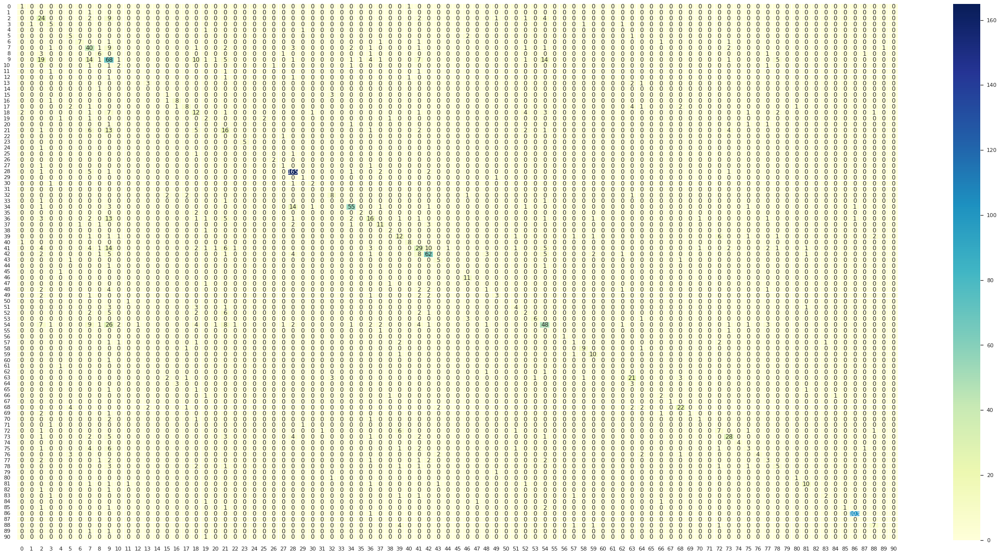

102


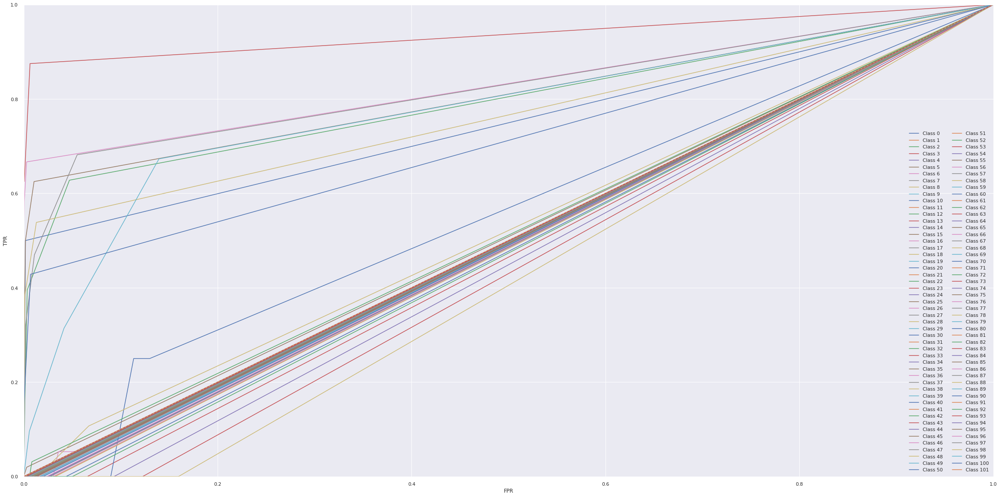






2th run of <class 'sklearn.neighbors._classification.KNeighborsClassifier'>
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         2
           1       1.00      1.00      1.00         1
           2       0.28      0.44      0.35        43
           3       0.25      0.22      0.24         9
           4       0.14      0.33      0.20         3
           5       0.33      0.57      0.42         7
           6       0.62      0.67      0.64        12
           7       0.47      0.68      0.56        65
           8       0.33      0.58      0.42        12
           9       0.36      0.54      0.43       157
          10       0.12      0.14      0.13         7
          11       0.00      0.00      0.00         3
          12       0.33      0.50      0.40         4
          13       0.00      0.00      0.00         0
          15       0.29      0.33      0.31         6
          16       0.00      0.00      0.00         1


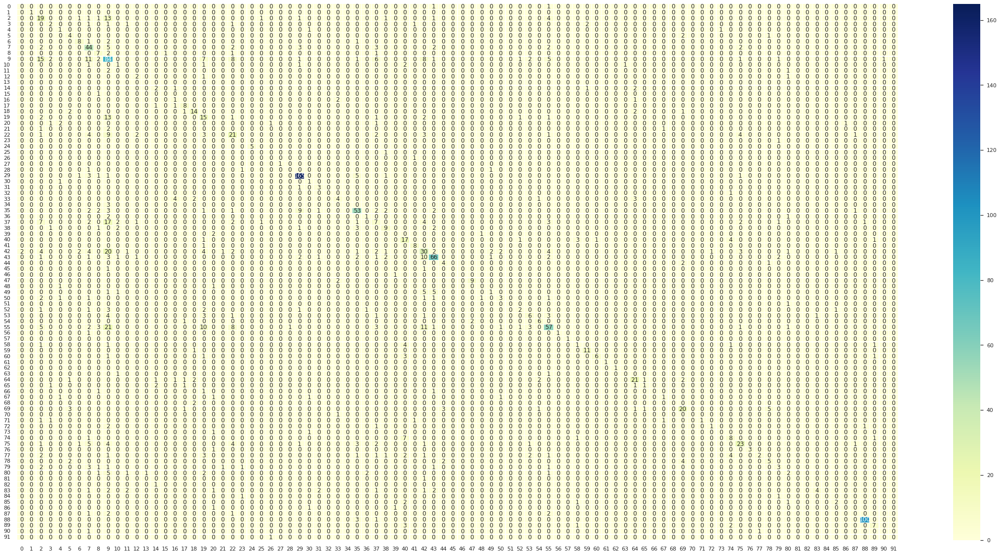

101


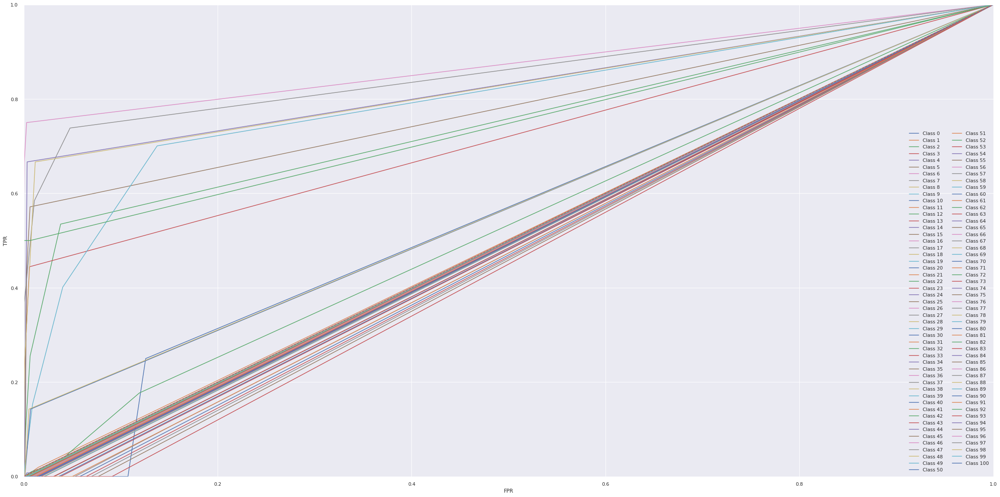






3th run of <class 'sklearn.neighbors._classification.KNeighborsClassifier'>
              precision    recall  f1-score   support

           0       0.20      1.00      0.33         1
           2       0.26      0.44      0.33        43
           3       0.71      0.56      0.63         9
           4       0.20      0.50      0.29         2
           5       0.33      0.71      0.45         7
           6       0.65      0.92      0.76        12
           7       0.43      0.60      0.50        65
           8       0.26      0.42      0.32        12
           9       0.35      0.47      0.40       156
          10       0.50      0.25      0.33         8
          11       0.33      0.25      0.29         4
          12       0.50      0.50      0.50         4
          13       0.00      0.00      0.00         0
          15       0.56      0.83      0.67         6
          16       0.00      0.00      0.00         1
          17       0.33      0.50      0.40         4


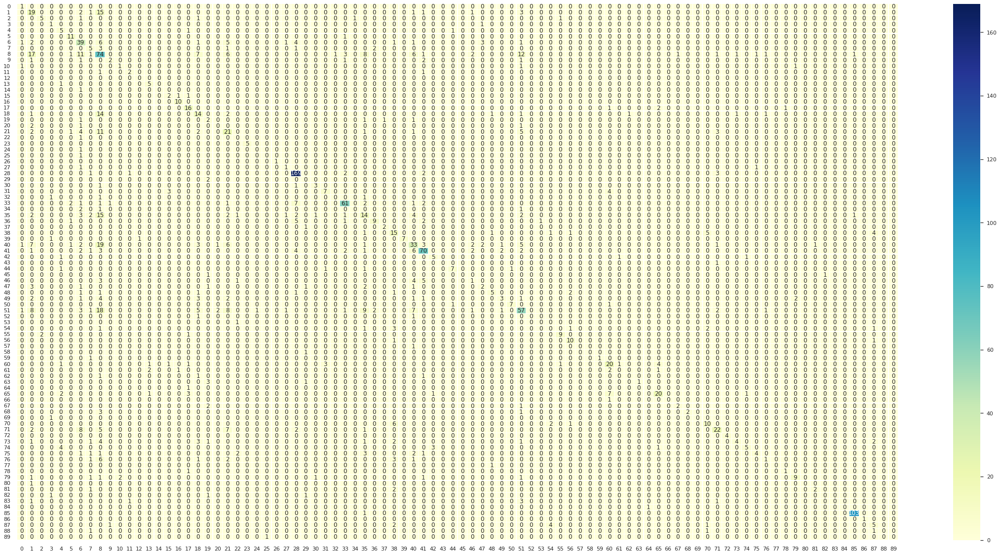

102


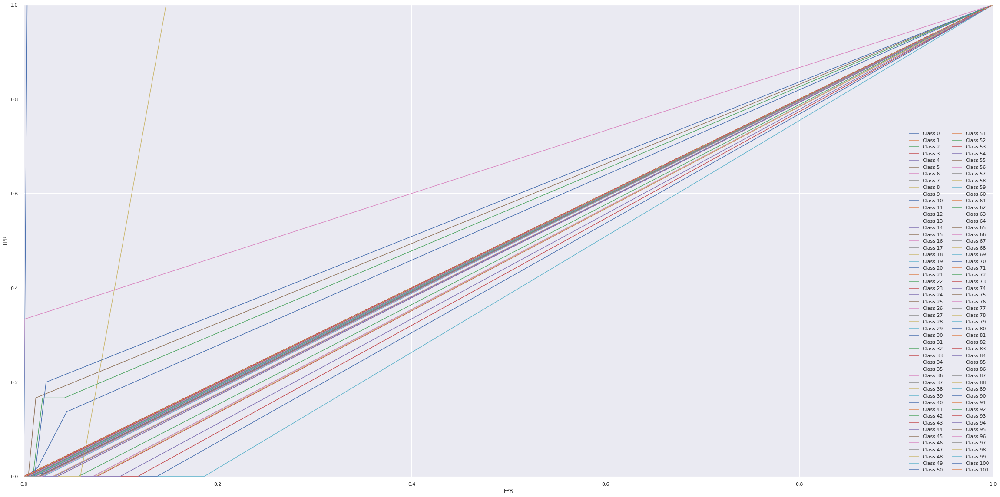






4th run of <class 'sklearn.neighbors._classification.KNeighborsClassifier'>
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         2
           2       0.29      0.51      0.37        43
           3       0.50      0.44      0.47         9
           4       0.17      0.50      0.25         2
           5       0.60      0.38      0.46         8
           6       0.50      0.67      0.57        12
           7       0.41      0.60      0.48        65
           8       0.32      0.50      0.39        12
           9       0.38      0.49      0.43       156
          10       0.33      0.38      0.35         8
          11       0.00      0.00      0.00         4
          12       0.50      0.50      0.50         4
          13       0.00      0.00      0.00         0
          15       0.43      0.50      0.46         6
          16       0.50      1.00      0.67         1
          17       0.50      0.75      0.60         4


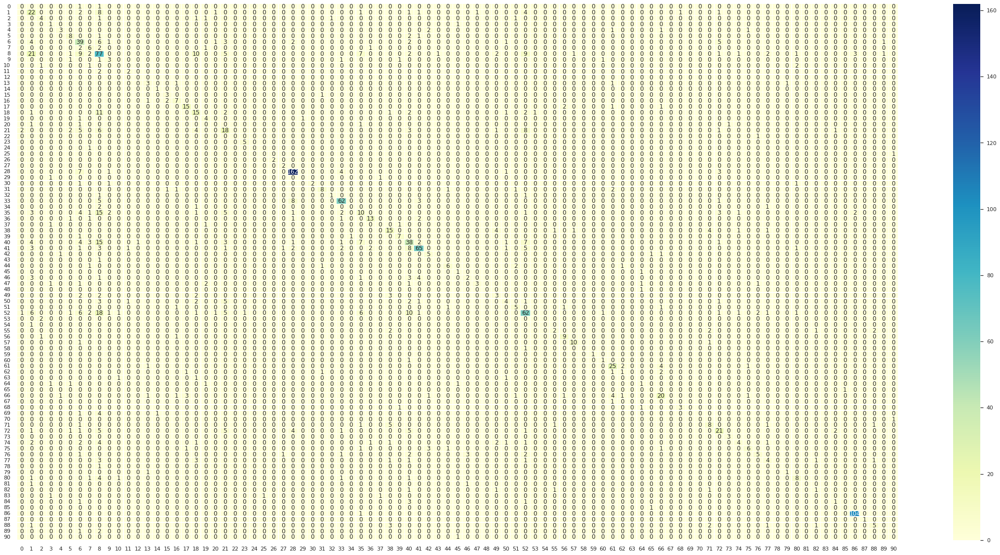

102


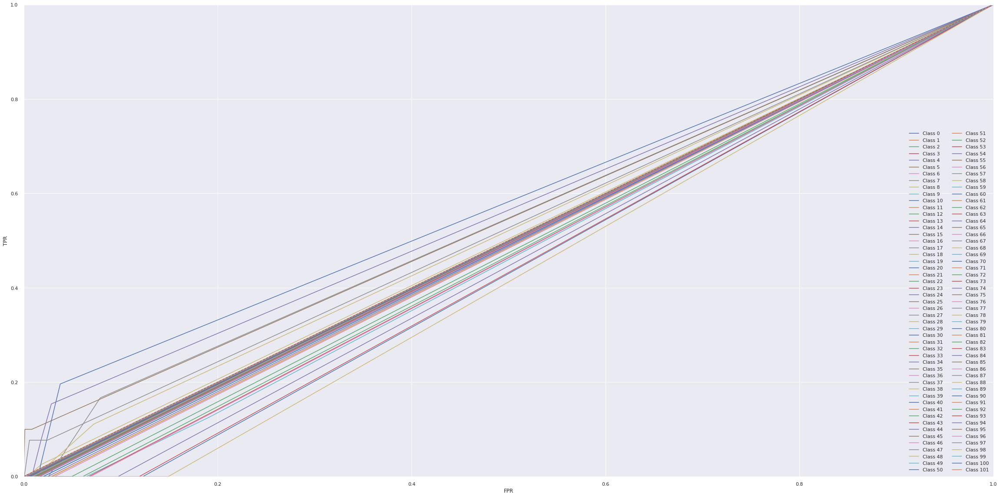






5th run of <class 'sklearn.neighbors._classification.KNeighborsClassifier'>
              precision    recall  f1-score   support

           0       0.50      0.50      0.50         2
           2       0.22      0.38      0.28        42
           3       0.43      0.67      0.52         9
           4       0.00      0.00      0.00         2
           5       0.29      0.25      0.27         8
           6       0.65      0.92      0.76        12
           7       0.39      0.61      0.48        66
           8       0.38      0.50      0.43        12
           9       0.35      0.47      0.40       156
          10       0.40      0.50      0.44         8
          11       0.00      0.00      0.00         4
          12       0.25      0.33      0.29         3
          13       0.00      0.00      0.00         1
          15       0.55      1.00      0.71         6
          16       0.00      0.00      0.00         1
          17       0.50      0.25      0.33         4


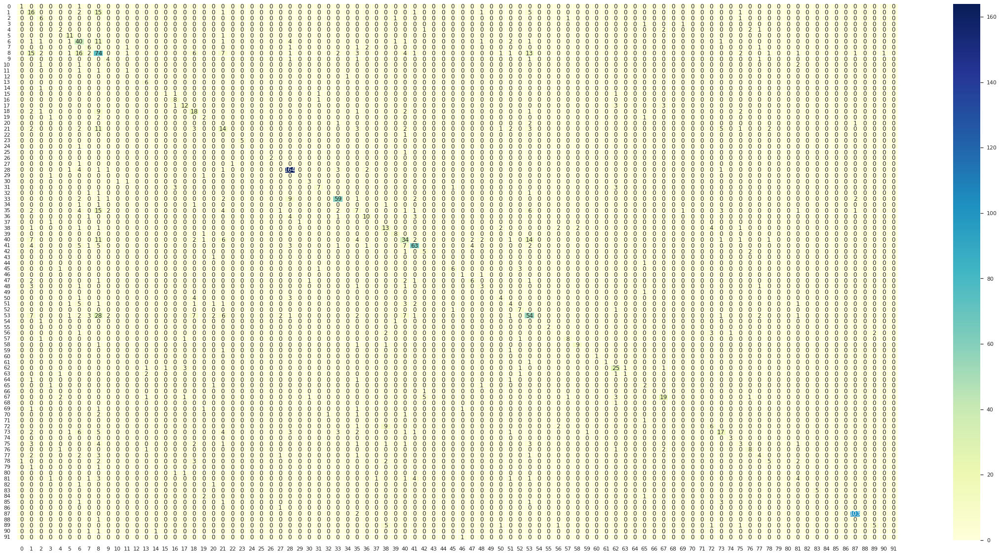

101


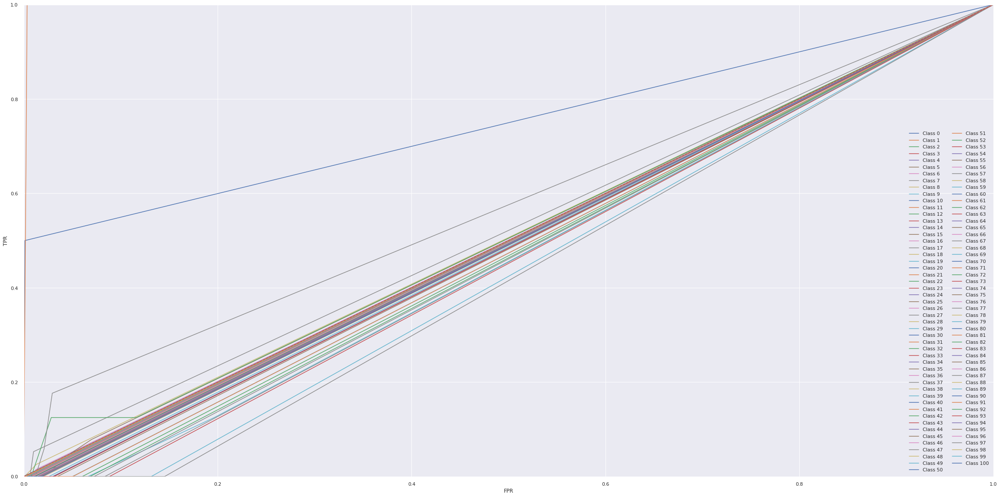






6th run of <class 'sklearn.neighbors._classification.KNeighborsClassifier'>
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         2
           1       1.00      1.00      1.00         1
           2       0.22      0.36      0.28        42
           3       0.88      0.78      0.82         9
           4       0.20      0.50      0.29         2
           5       0.67      0.25      0.36         8
           6       0.52      0.85      0.65        13
           7       0.42      0.53      0.47        66
           8       0.38      0.46      0.41        13
           9       0.33      0.51      0.40       156
          10       0.20      0.38      0.26         8
          11       0.00      0.00      0.00         3
          12       0.40      0.67      0.50         3
          15       0.40      0.67      0.50         6
          16       0.00      0.00      0.00         1
          17       0.22      0.50      0.31         4


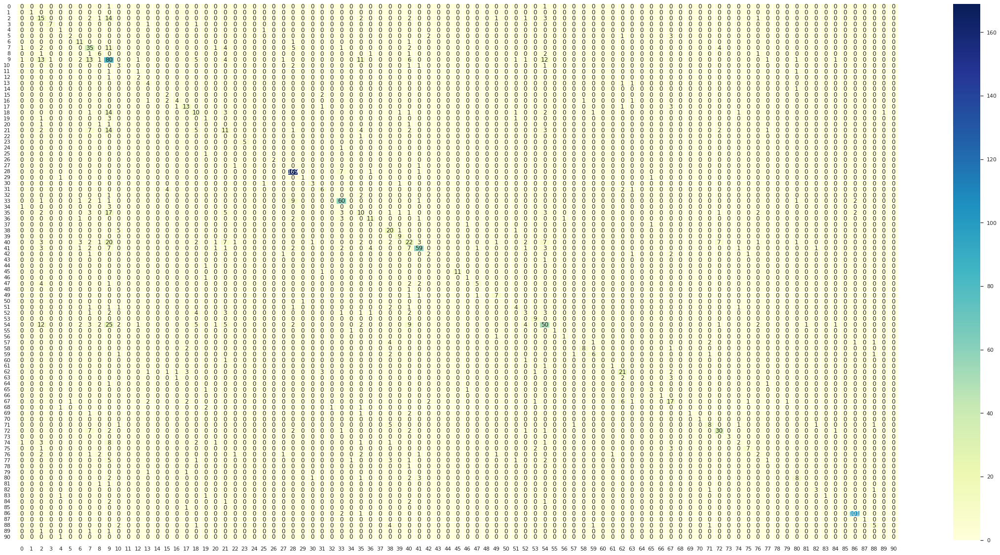

101


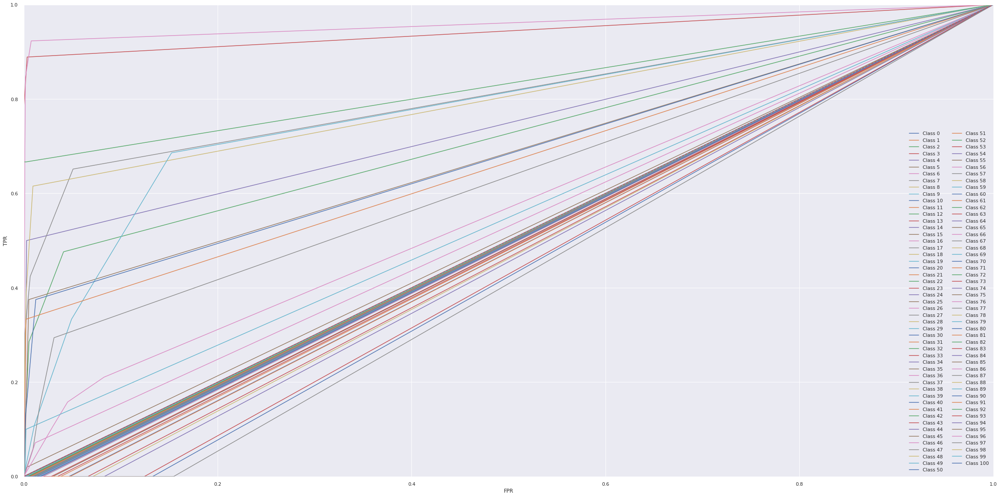






7th run of <class 'sklearn.neighbors._classification.KNeighborsClassifier'>
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         2
           1       1.00      1.00      1.00         1
           2       0.33      0.62      0.43        42
           3       0.40      0.67      0.50         9
           4       0.50      0.50      0.50         2
           5       0.42      0.62      0.50         8
           6       0.77      0.83      0.80        12
           7       0.49      0.65      0.56        66
           8       0.36      0.38      0.37        13
           9       0.36      0.48      0.41       156
          10       0.20      0.12      0.15         8
          11       0.50      0.33      0.40         3
          12       0.57      1.00      0.73         4
          13       0.00      0.00      0.00         0
          14       0.00      0.00      0.00         1
          15       0.62      0.71      0.67         7


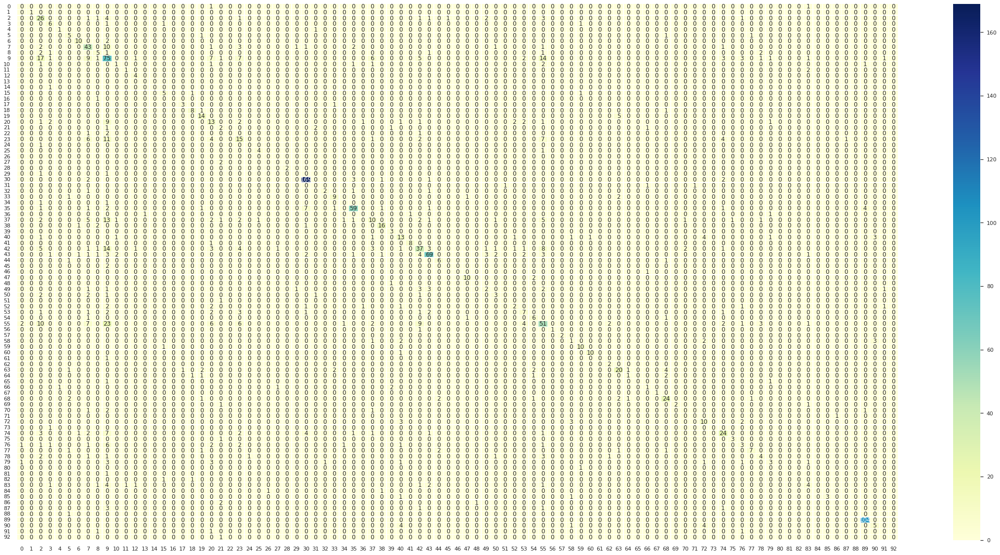

99


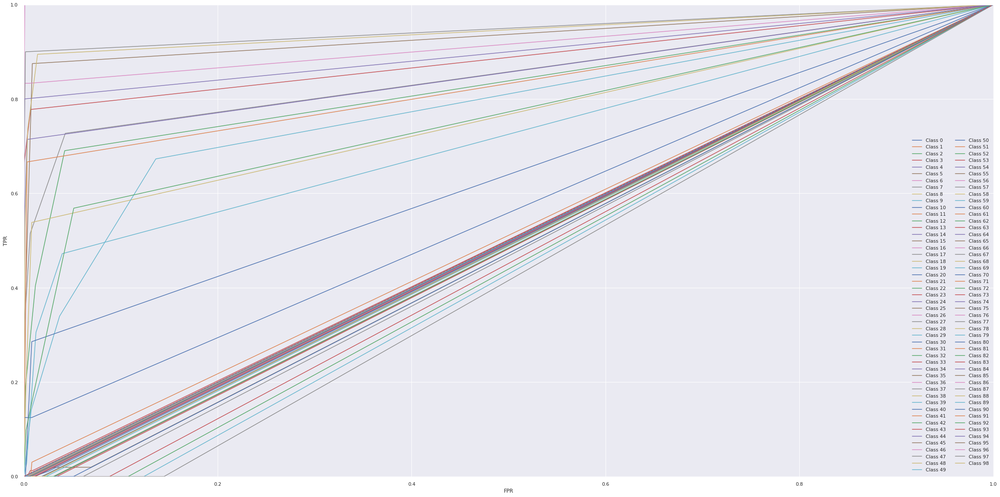






8th run of <class 'sklearn.neighbors._classification.KNeighborsClassifier'>
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         2
           1       0.00      0.00      0.00         1
           2       0.22      0.33      0.26        42
           3       0.44      0.50      0.47         8
           4       0.50      0.50      0.50         2
           5       0.50      0.62      0.56         8
           6       0.64      0.75      0.69        12
           7       0.44      0.68      0.54        66
           8       0.23      0.38      0.29        13
           9       0.34      0.51      0.41       156
          10       0.31      0.50      0.38         8
          11       0.00      0.00      0.00         3
          12       0.80      1.00      0.89         4
          15       0.30      0.43      0.35         7
          16       0.00      0.00      0.00         1
          17       0.00      0.00      0.00         4


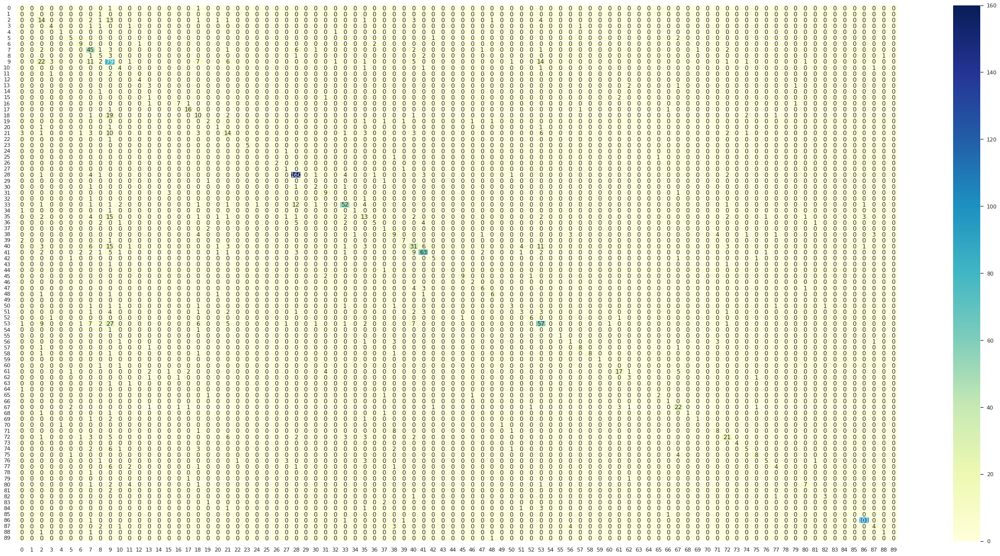

101


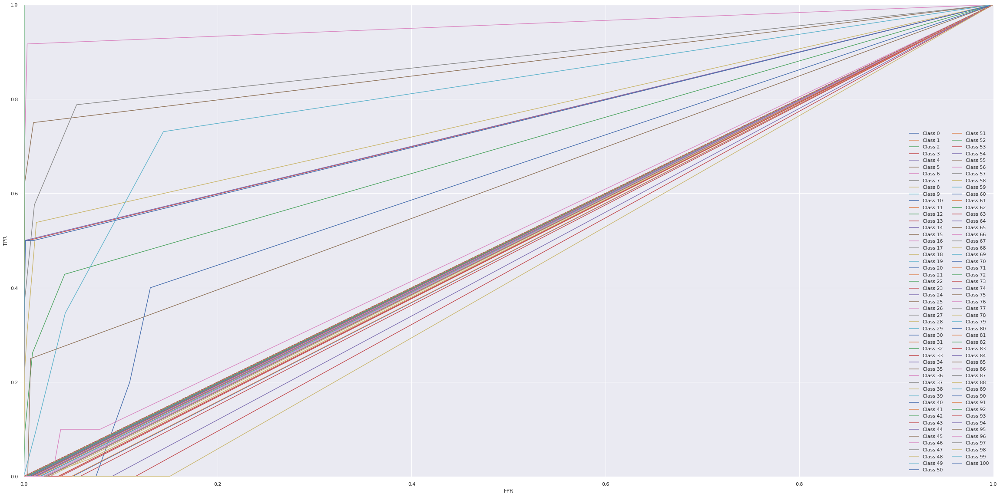






9th run of <class 'sklearn.neighbors._classification.KNeighborsClassifier'>
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         2
           1       0.50      1.00      0.67         1
           2       0.25      0.37      0.30        43
           3       0.43      0.75      0.55         8
           4       0.20      0.50      0.29         2
           5       0.50      0.62      0.56         8
           6       0.53      0.83      0.65        12
           7       0.45      0.56      0.50        66
           8       0.27      0.46      0.34        13
           9       0.40      0.53      0.46       156
          10       0.22      0.25      0.24         8
          11       0.00      0.00      0.00         3
          12       0.43      0.75      0.55         4
          15       0.71      0.83      0.77         6
          16       0.00      0.00      0.00         1
          17       0.67      0.50      0.57         4


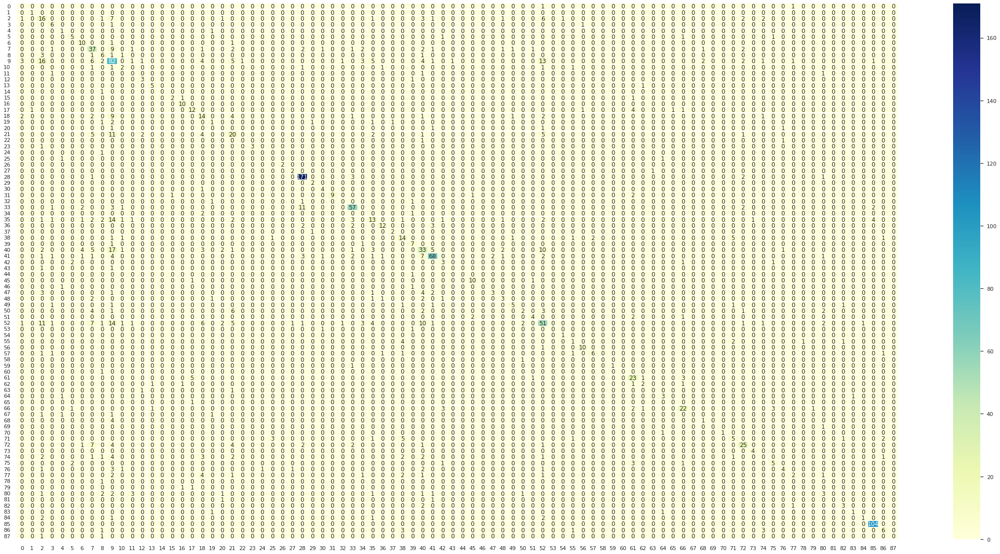

100


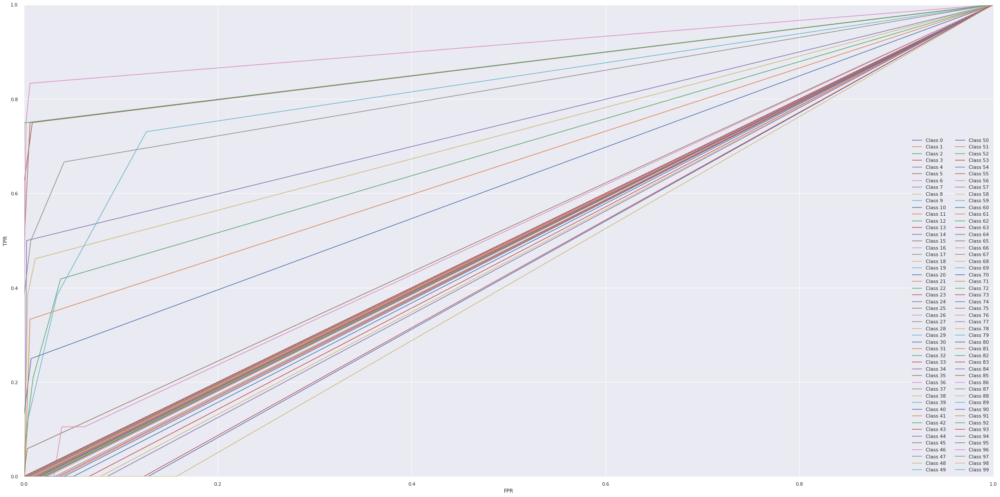






10th run of <class 'sklearn.neighbors._classification.KNeighborsClassifier'>
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         2
           1       1.00      1.00      1.00         1
           2       0.32      0.44      0.37        43
           3       0.70      0.88      0.78         8
           4       0.00      0.00      0.00         2
           5       0.62      0.62      0.62         8
           6       0.50      0.83      0.62        12
           7       0.53      0.62      0.57        66
           8       0.31      0.85      0.46        13
           9       0.38      0.51      0.44       156
          10       0.00      0.00      0.00         8
          11       0.00      0.00      0.00         3
          12       0.50      0.50      0.50         4
          13       0.00      0.00      0.00         0
          15       0.36      0.67      0.47         6
          16       0.00      0.00      0.00         1

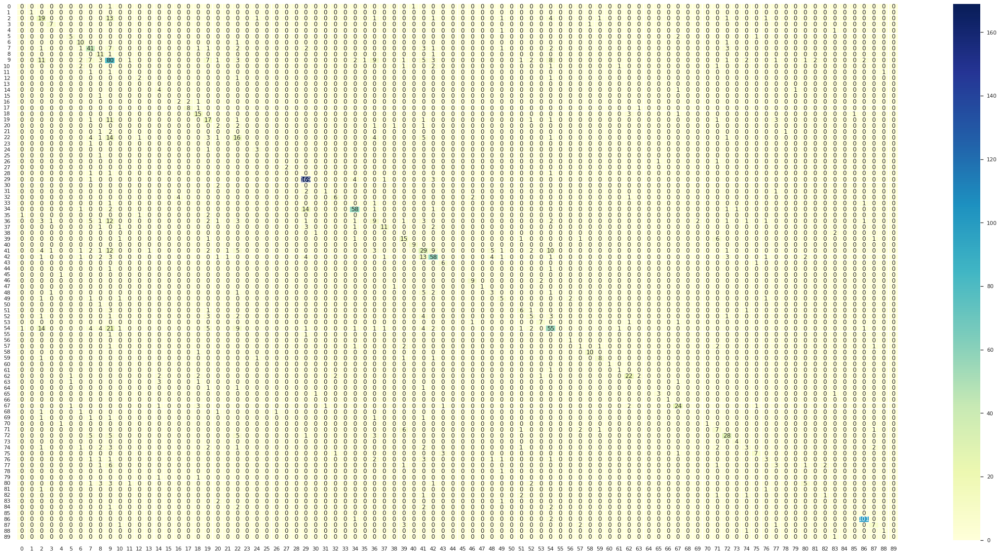

102


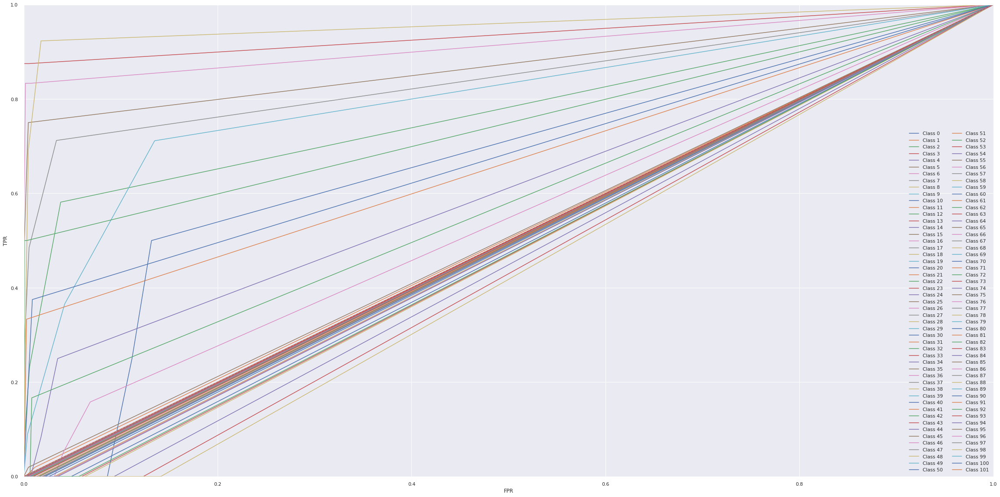





Classifier is DecisionTreeClassifier(max_depth=5)

1th run of <class 'sklearn.tree._classes.DecisionTreeClassifier'>
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         2
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        43
           3       0.00      0.00      0.00         8
           4       0.00      0.00      0.00         2
           5       0.00      0.00      0.00         8
           6       0.00      0.00      0.00        12
           7       0.44      0.11      0.17        66
           8       0.00      0.00      0.00        13
           9       0.28      0.79      0.41       156
          10       0.00      0.00      0.00         7
          11       0.00      0.00      0.00         3
          12       0.00      0.00      0.00         4
          15       0.00      0.00      0.00         6
          16       0.00      0.00      0.00         1
          17  

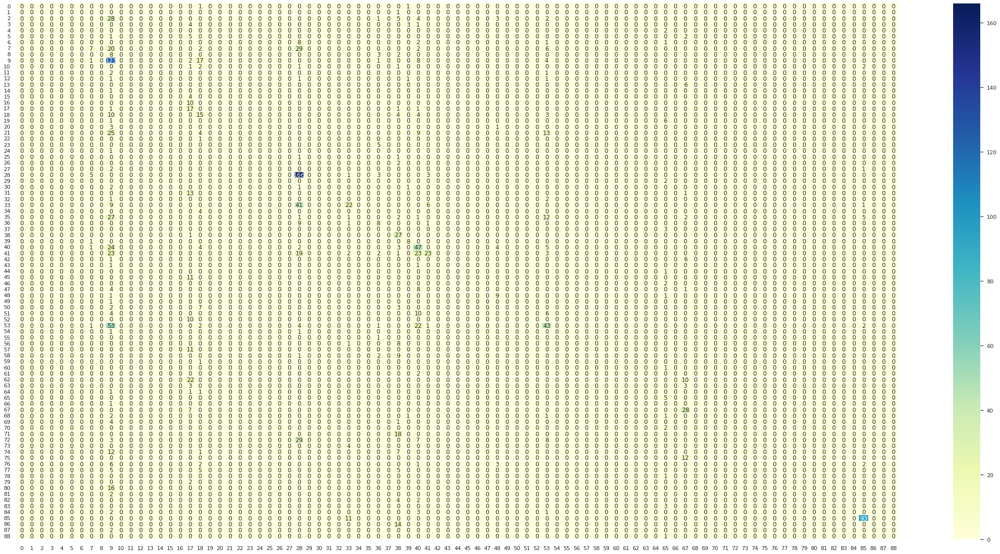

102


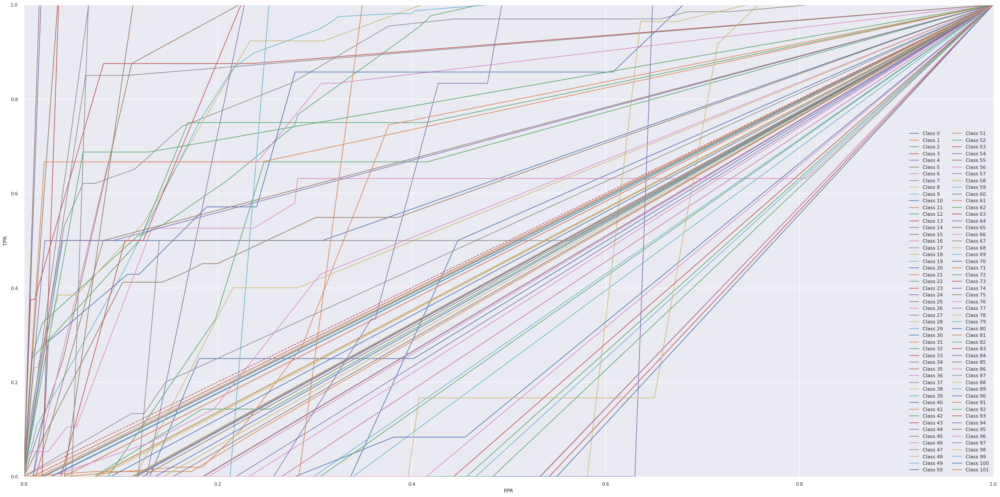






2th run of <class 'sklearn.tree._classes.DecisionTreeClassifier'>
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         2
           1       0.00      0.00      0.00         1
           2       0.39      0.16      0.23        43
           3       0.00      0.00      0.00         9
           4       0.00      0.00      0.00         3
           5       0.00      0.00      0.00         7
           6       0.00      0.00      0.00        12
           7       0.30      0.05      0.08        65
           8       0.00      0.00      0.00        12
           9       0.31      0.48      0.38       157
          10       0.00      0.00      0.00         7
          11       0.00      0.00      0.00         3
          12       0.00      0.00      0.00         4
          15       0.00      0.00      0.00         6
          16       0.00      0.00      0.00         1
          17       0.00      0.00      0.00         4
          

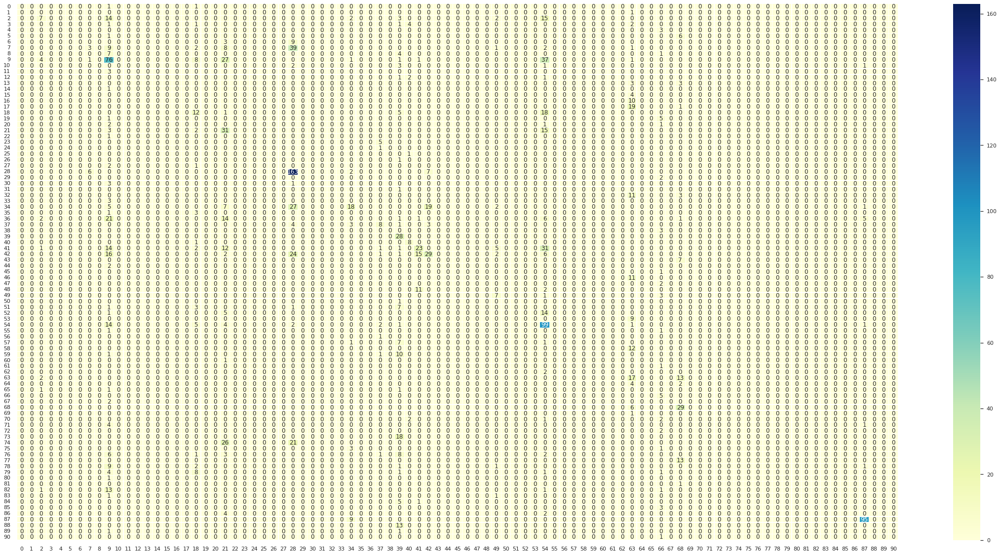

101


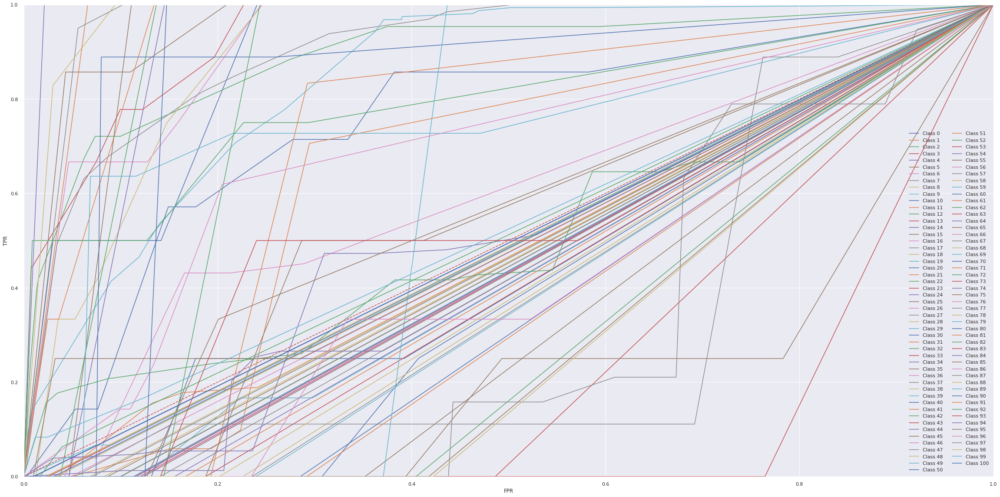






3th run of <class 'sklearn.tree._classes.DecisionTreeClassifier'>
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        43
           3       0.00      0.00      0.00         9
           4       0.00      0.00      0.00         2
           5       0.00      0.00      0.00         7
           6       0.33      0.17      0.22        12
           7       0.50      0.11      0.18        65
           8       0.00      0.00      0.00        12
           9       0.28      0.80      0.42       156
          10       0.00      0.00      0.00         8
          11       0.00      0.00      0.00         4
          12       0.00      0.00      0.00         4
          15       0.00      0.00      0.00         6
          16       0.00      0.00      0.00         1
          17       0.00      0.00      0.00         4
          18       0.00      0.00      0.00        10
          

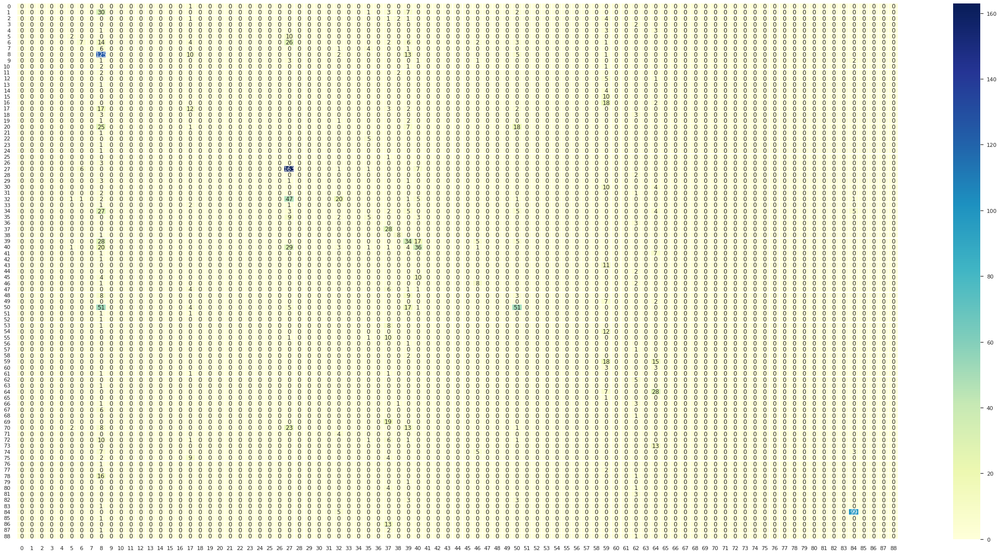

102


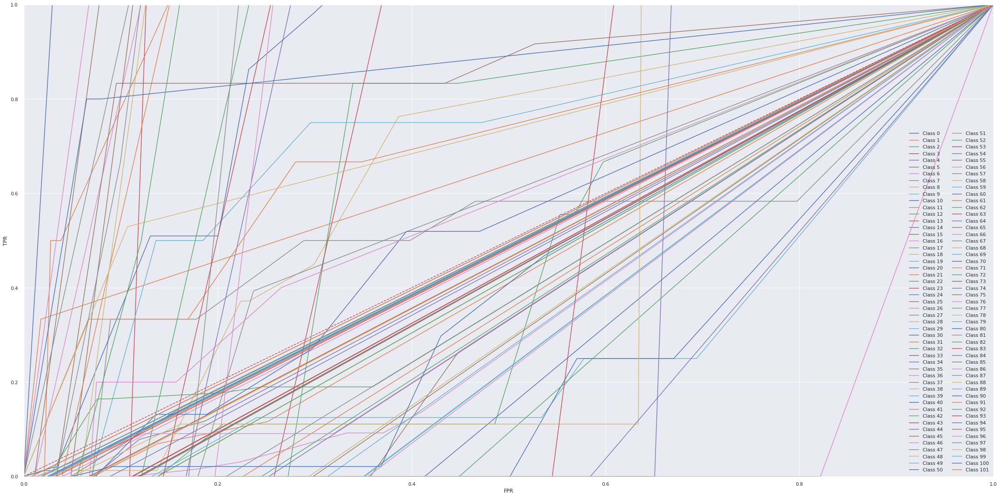






4th run of <class 'sklearn.tree._classes.DecisionTreeClassifier'>
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         2
           2       0.00      0.00      0.00        43
           3       0.00      0.00      0.00         9
           4       0.00      0.00      0.00         2
           5       0.00      0.00      0.00         8
           6       0.00      0.00      0.00        12
           7       0.54      0.11      0.18        65
           8       0.00      0.00      0.00        12
           9       0.29      0.80      0.43       156
          10       0.00      0.00      0.00         8
          11       0.00      0.00      0.00         4
          12       0.00      0.00      0.00         4
          15       0.00      0.00      0.00         6
          16       0.00      0.00      0.00         1
          17       0.00      0.00      0.00         4
          18       0.00      0.00      0.00        10
          

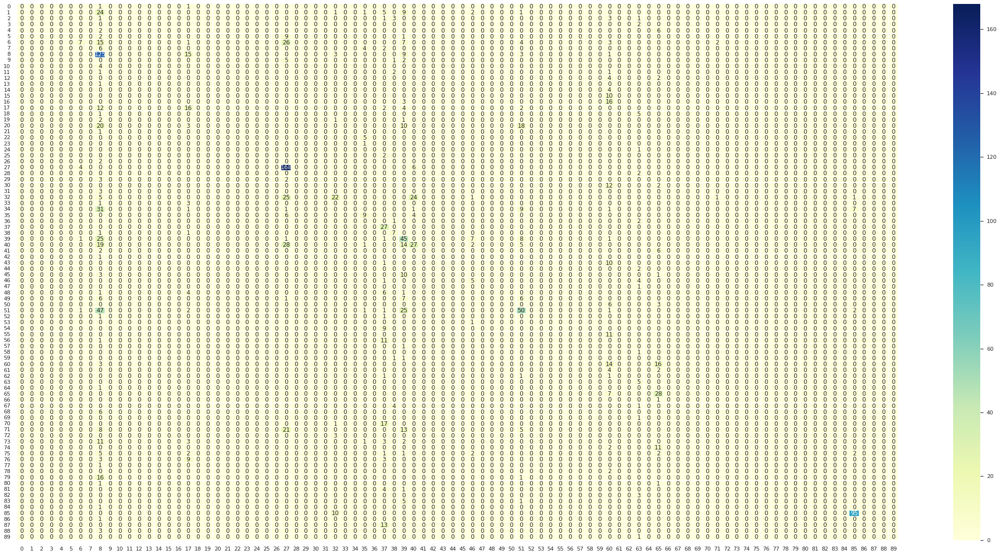

102


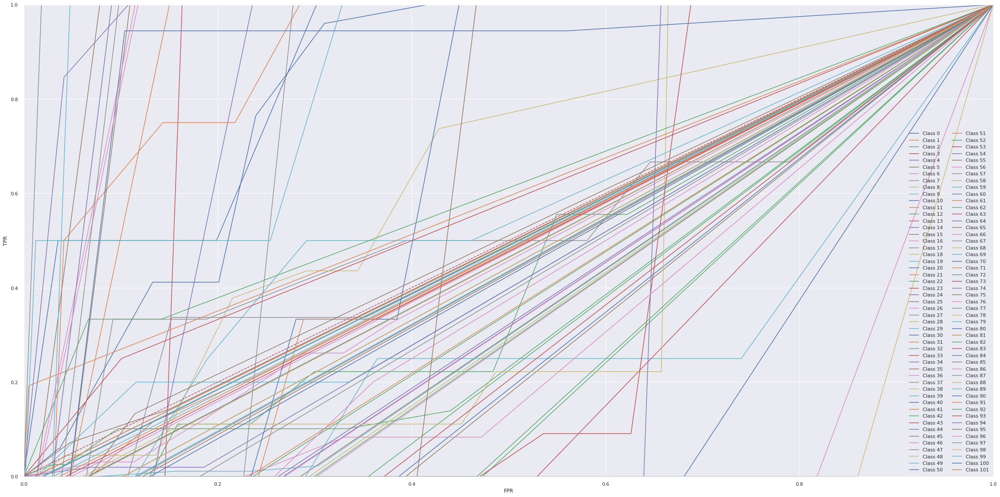






5th run of <class 'sklearn.tree._classes.DecisionTreeClassifier'>
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         2
           2       0.33      0.12      0.18        42
           3       0.00      0.00      0.00         9
           4       0.00      0.00      0.00         2
           5       0.00      0.00      0.00         8
           6       0.00      0.00      0.00        12
           7       0.38      0.08      0.13        66
           8       0.00      0.00      0.00        12
           9       0.30      0.47      0.36       156
          10       0.00      0.00      0.00         8
          11       0.00      0.00      0.00         4
          12       0.00      0.00      0.00         3
          13       0.00      0.00      0.00         1
          15       0.00      0.00      0.00         6
          16       0.00      0.00      0.00         1
          17       0.00      0.00      0.00         4
          

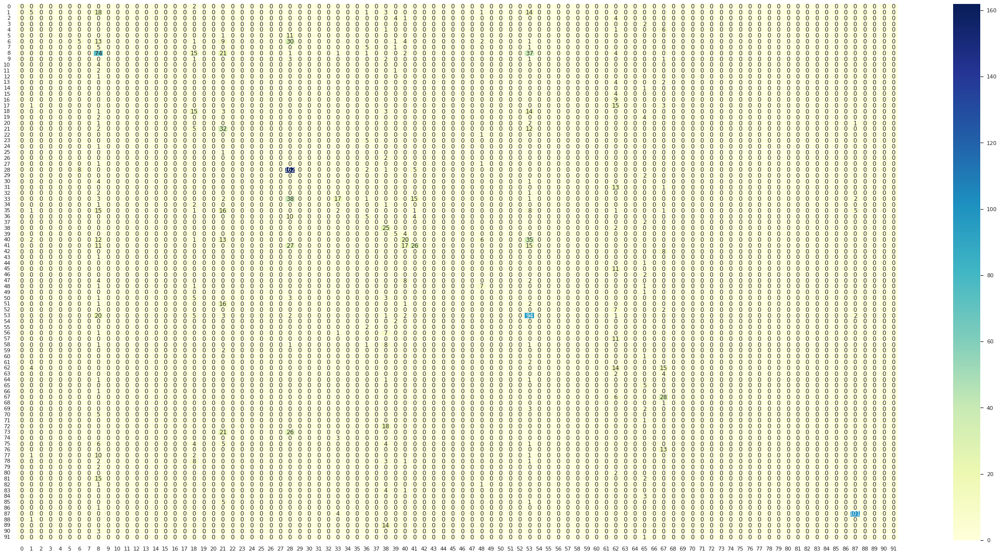

101


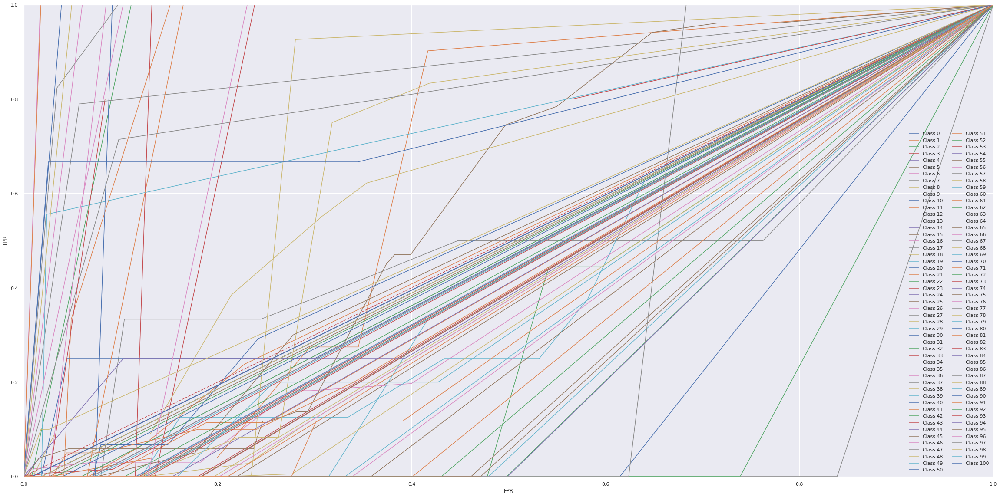






6th run of <class 'sklearn.tree._classes.DecisionTreeClassifier'>
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         2
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        42
           3       0.00      0.00      0.00         9
           4       0.00      0.00      0.00         2
           5       0.00      0.00      0.00         8
           6       0.50      0.15      0.24        13
           7       0.57      0.12      0.20        66
           8       0.00      0.00      0.00        13
           9       0.27      0.79      0.41       156
          10       0.00      0.00      0.00         8
          11       0.00      0.00      0.00         3
          12       0.00      0.00      0.00         3
          15       0.00      0.00      0.00         6
          16       0.00      0.00      0.00         1
          17       0.00      0.00      0.00         4
          

In [ ]:
classifiers = [
    KNeighborsClassifier(3),
    DecisionTreeClassifier(max_depth=5),
    RandomForestClassifier(max_depth=5, n_estimators=10, max_features=1),
    MultinomialNB(),
    LogisticRegression(random_state=0, n_jobs = -1),
    MLPClassifier(random_state=1)
    ]


if __name__ == '__main__':
    X, y = get_X_y()
    print(len(y),y)
    print(f"X_train.shape is {X.shape} and y_train.shape is {y.shape}")
    for classifier in classifiers:
        print(f"Classifier is {classifier}")
        classify(X, y, classifier, classifier.__class__.__name__)

